/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:50: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


image shape: (600, 800)
car pixels: 1300
non-car pixels: 478700
road pixels: 151955
non-road pixels: 328045


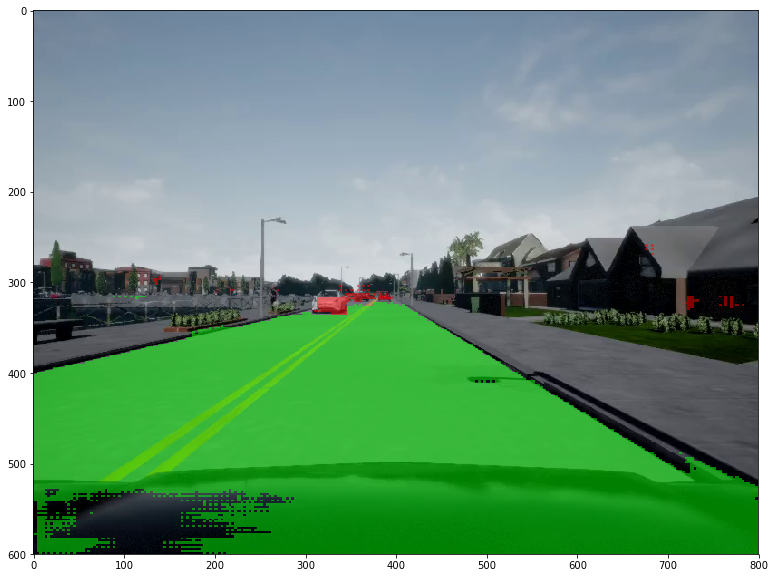

image shape: (600, 800)
car pixels: 1326
non-car pixels: 478674
road pixels: 153625
non-road pixels: 326375


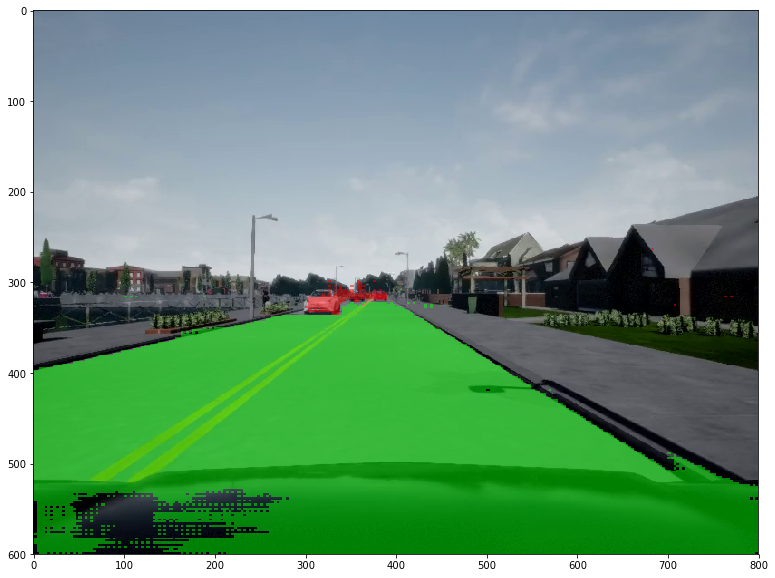

image shape: (600, 800)
car pixels: 1541
non-car pixels: 478459
road pixels: 153938
non-road pixels: 326062


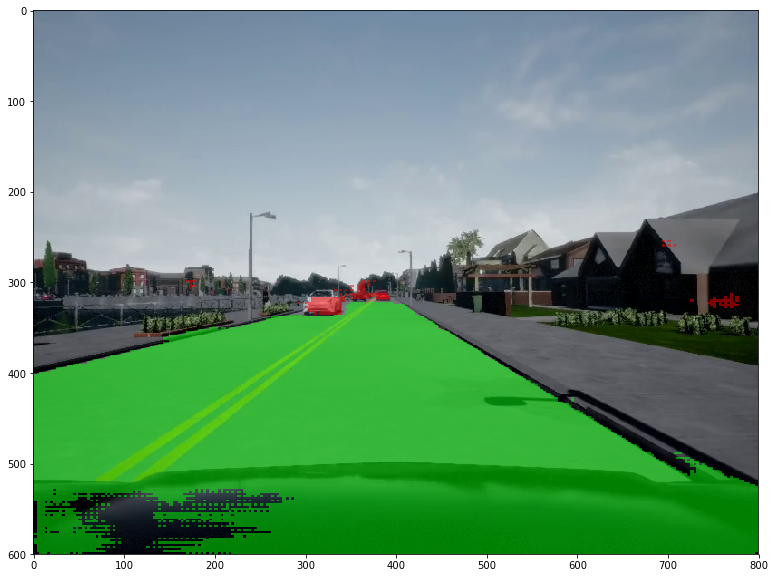

image shape: (600, 800)
car pixels: 1938
non-car pixels: 478062
road pixels: 153764
non-road pixels: 326236


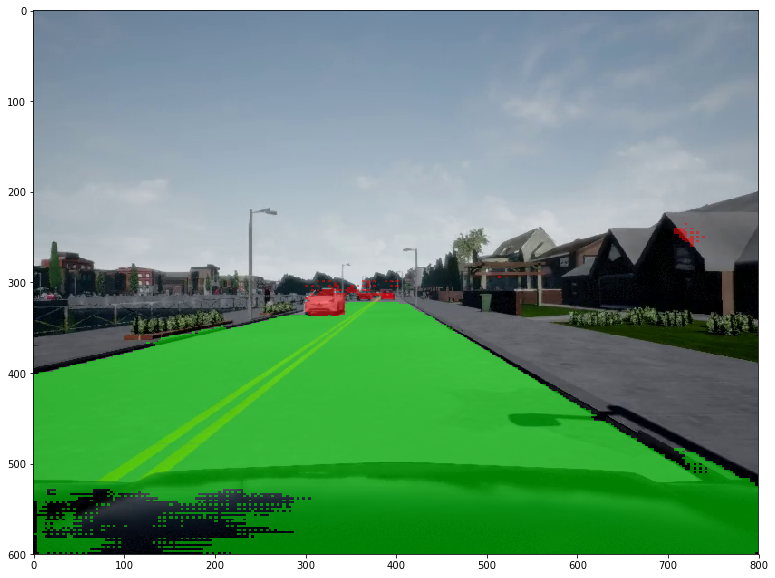

image shape: (600, 800)
car pixels: 1910
non-car pixels: 478090
road pixels: 156350
non-road pixels: 323650


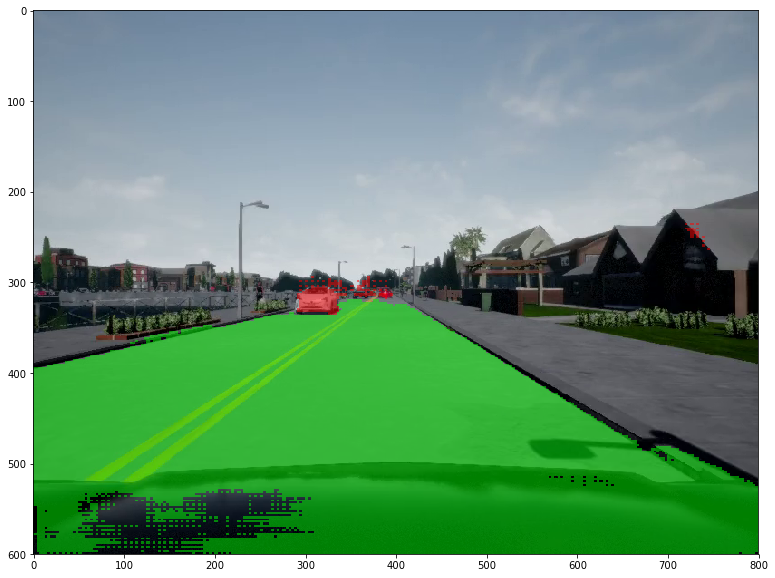

image shape: (600, 800)
car pixels: 2781
non-car pixels: 477219
road pixels: 153709
non-road pixels: 326291


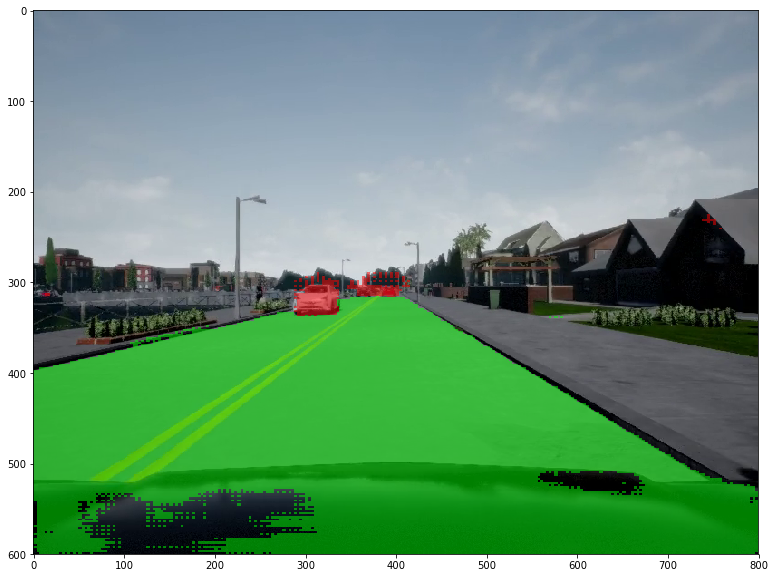

image shape: (600, 800)
car pixels: 2896
non-car pixels: 477104
road pixels: 154761
non-road pixels: 325239


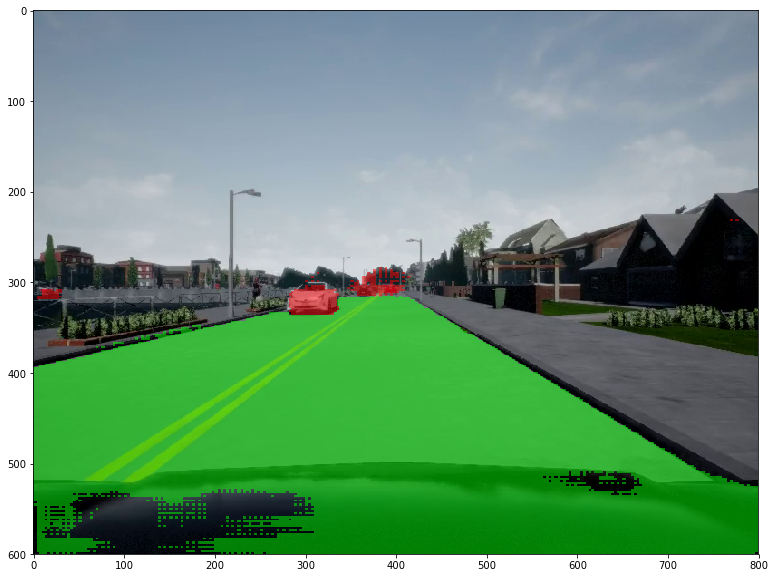

image shape: (600, 800)
car pixels: 2664
non-car pixels: 477336
road pixels: 157752
non-road pixels: 322248


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 4804
non-car pixels: 475196
road pixels: 151323
non-road pixels: 328677


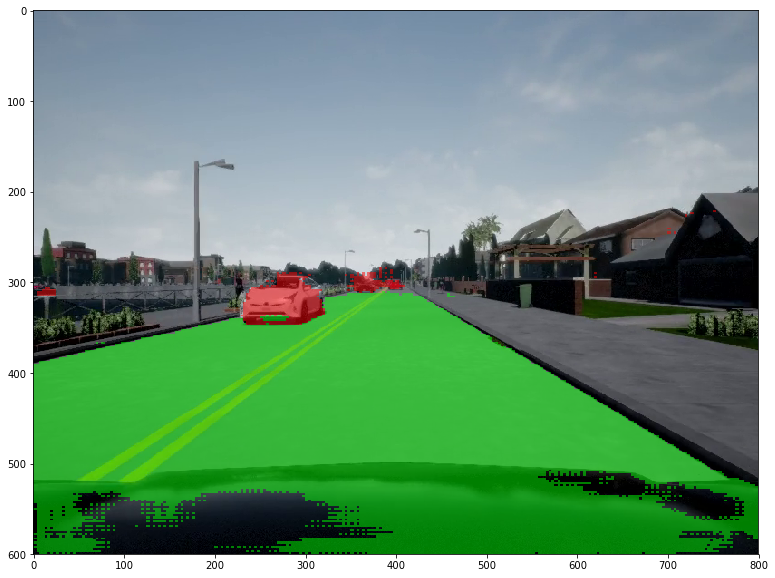

image shape: (600, 800)
car pixels: 5849
non-car pixels: 474151
road pixels: 151789
non-road pixels: 328211


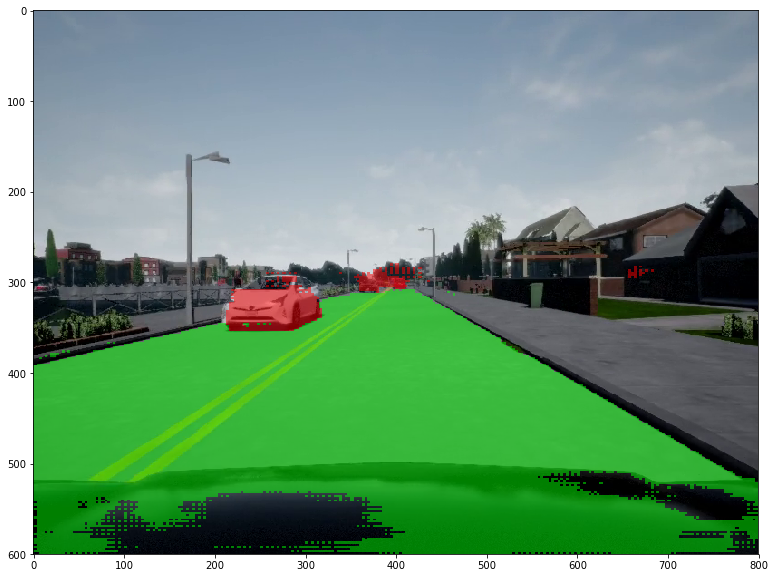

image shape: (600, 800)
car pixels: 8065
non-car pixels: 471935
road pixels: 143733
non-road pixels: 336267


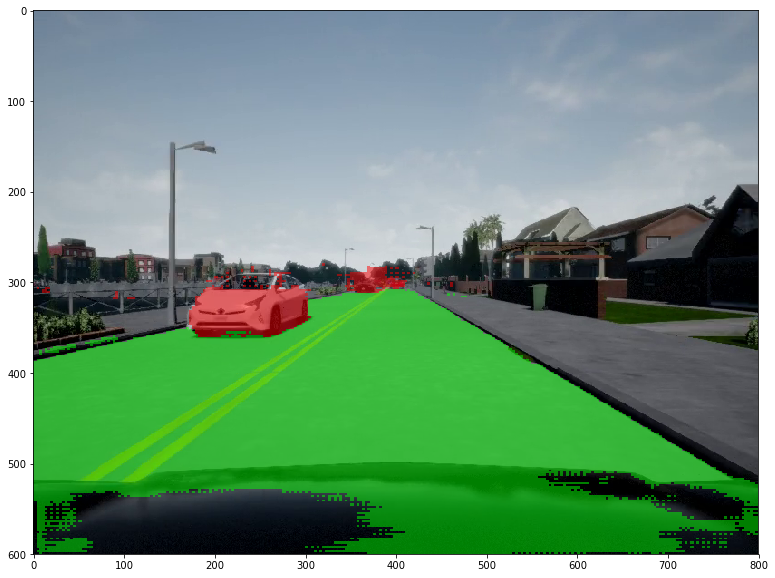

image shape: (600, 800)
car pixels: 12550
non-car pixels: 467450
road pixels: 141644
non-road pixels: 338356


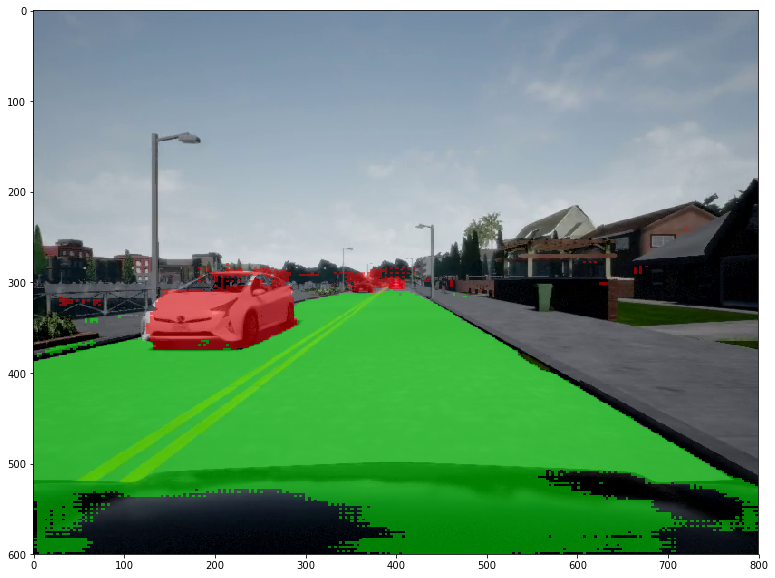

image shape: (600, 800)
car pixels: 19887
non-car pixels: 460113
road pixels: 140039
non-road pixels: 339961


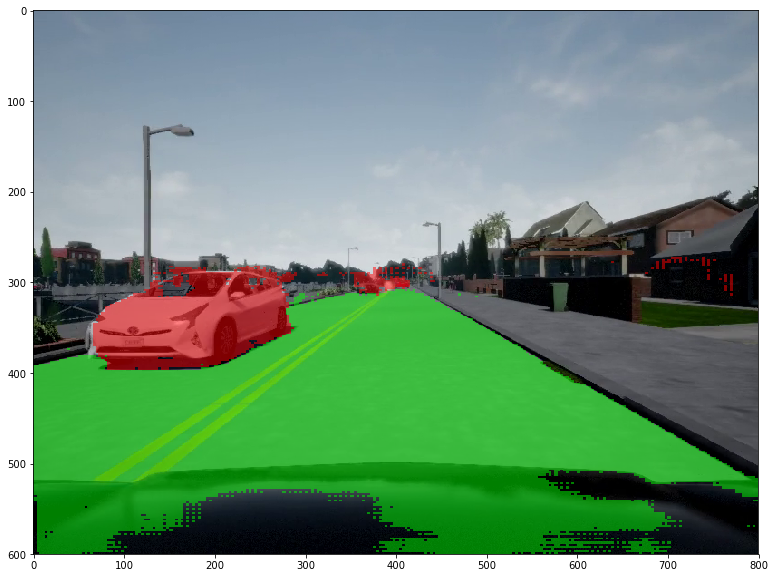

image shape: (600, 800)
car pixels: 19849
non-car pixels: 460151
road pixels: 140108
non-road pixels: 339892


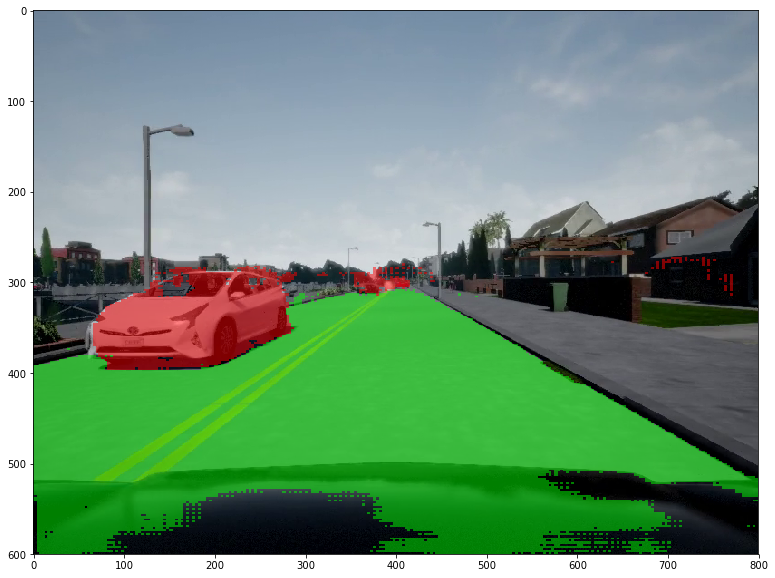

image shape: (600, 800)
car pixels: 23567
non-car pixels: 456433
road pixels: 129994
non-road pixels: 350006


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 8084
non-car pixels: 471916
road pixels: 136392
non-road pixels: 343608


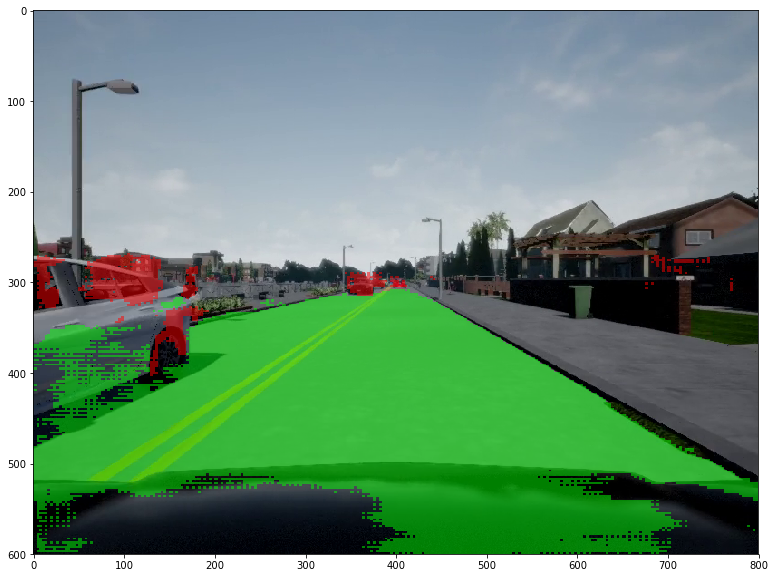

image shape: (600, 800)
car pixels: 1413
non-car pixels: 478587
road pixels: 136731
non-road pixels: 343269


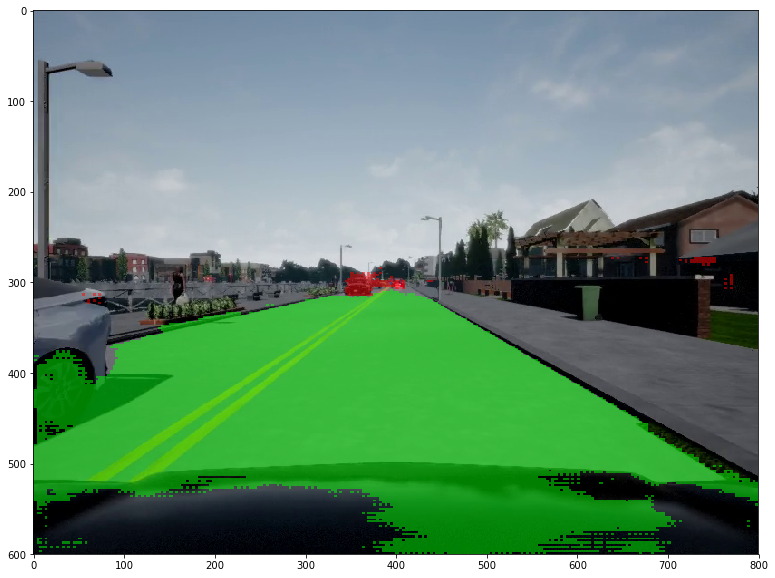

image shape: (600, 800)
car pixels: 1831
non-car pixels: 478169
road pixels: 152626
non-road pixels: 327374


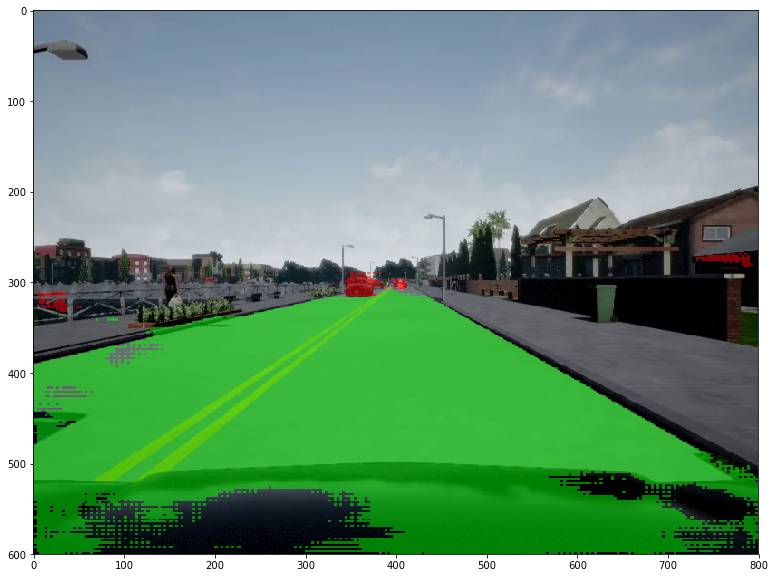

image shape: (600, 800)
car pixels: 1214
non-car pixels: 478786
road pixels: 155979
non-road pixels: 324021


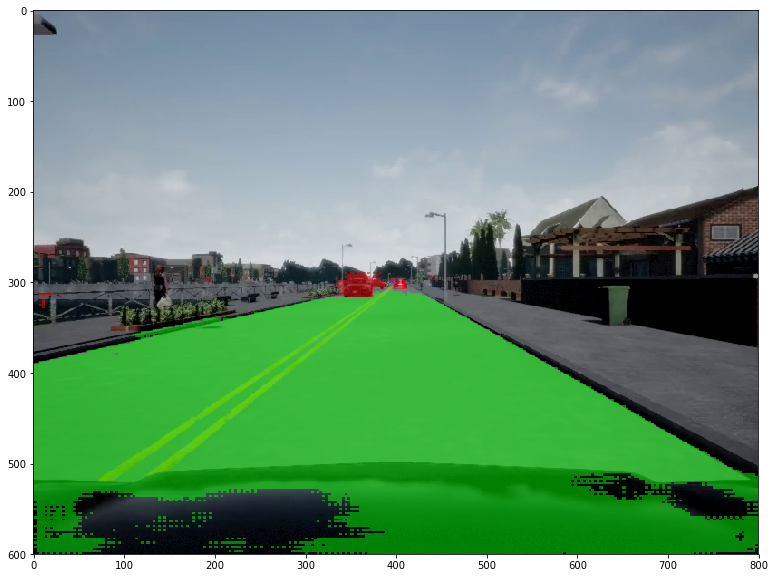

image shape: (600, 800)
car pixels: 1210
non-car pixels: 478790
road pixels: 157823
non-road pixels: 322177


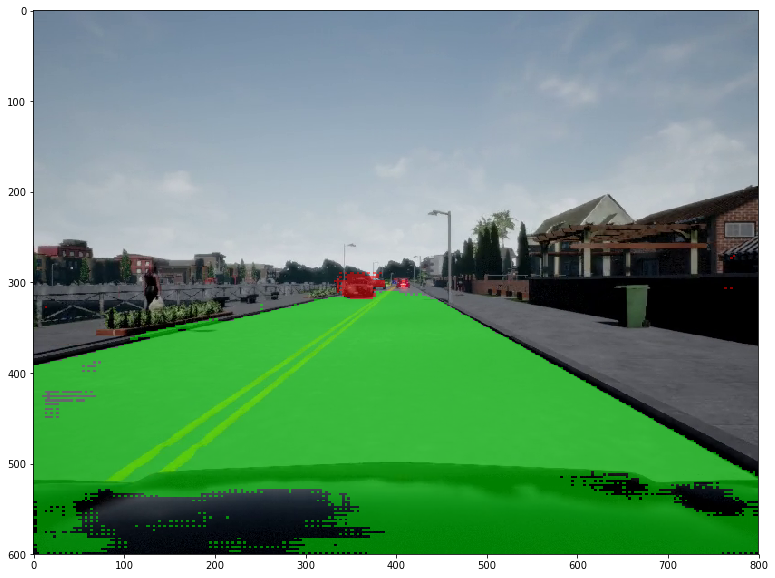

image shape: (600, 800)
car pixels: 1809
non-car pixels: 478191
road pixels: 159647
non-road pixels: 320353


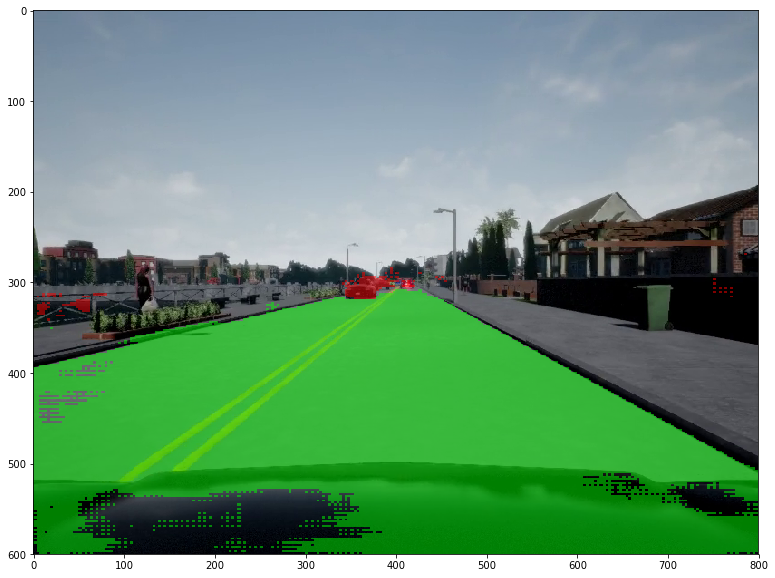

image shape: (600, 800)
car pixels: 1271
non-car pixels: 478729
road pixels: 159509
non-road pixels: 320491


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 1444
non-car pixels: 478556
road pixels: 152518
non-road pixels: 327482


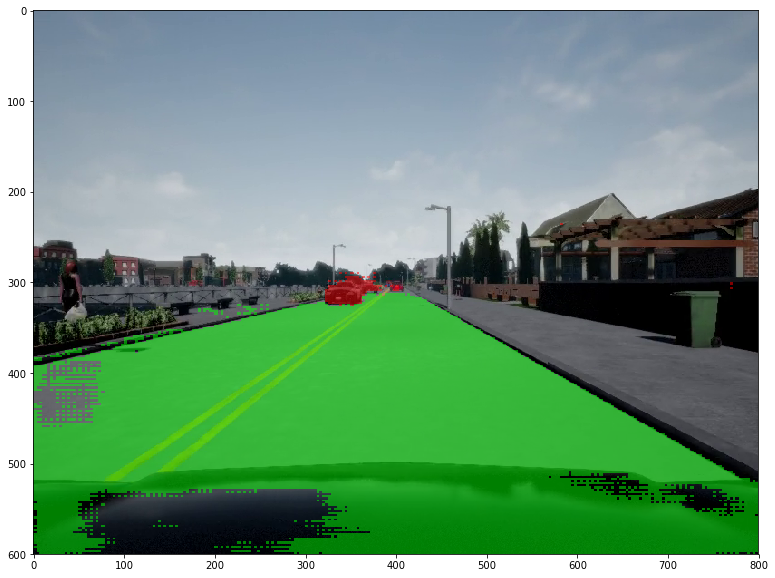

image shape: (600, 800)
car pixels: 1465
non-car pixels: 478535
road pixels: 152136
non-road pixels: 327864


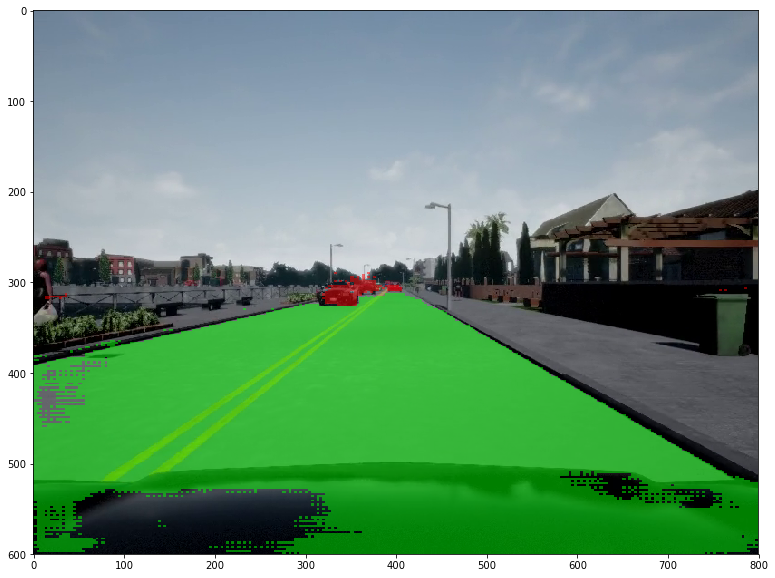

image shape: (600, 800)
car pixels: 1210
non-car pixels: 478790
road pixels: 153510
non-road pixels: 326490


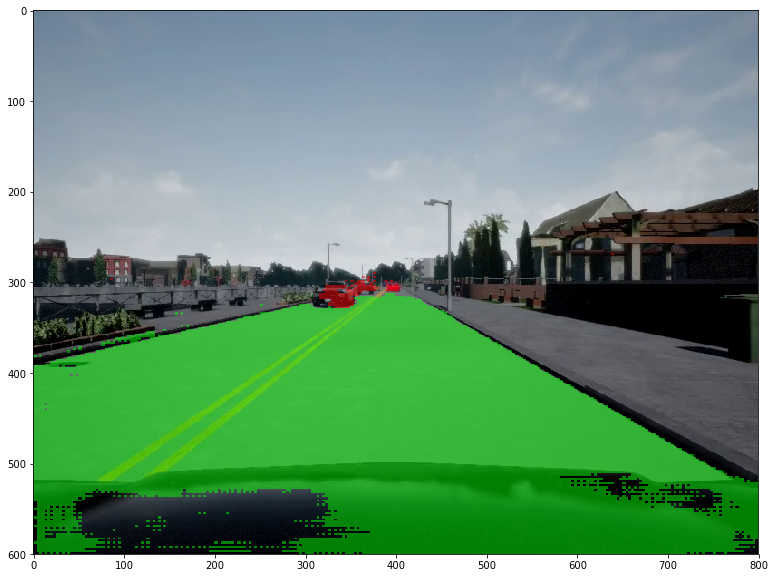

image shape: (600, 800)
car pixels: 1249
non-car pixels: 478751
road pixels: 153140
non-road pixels: 326860


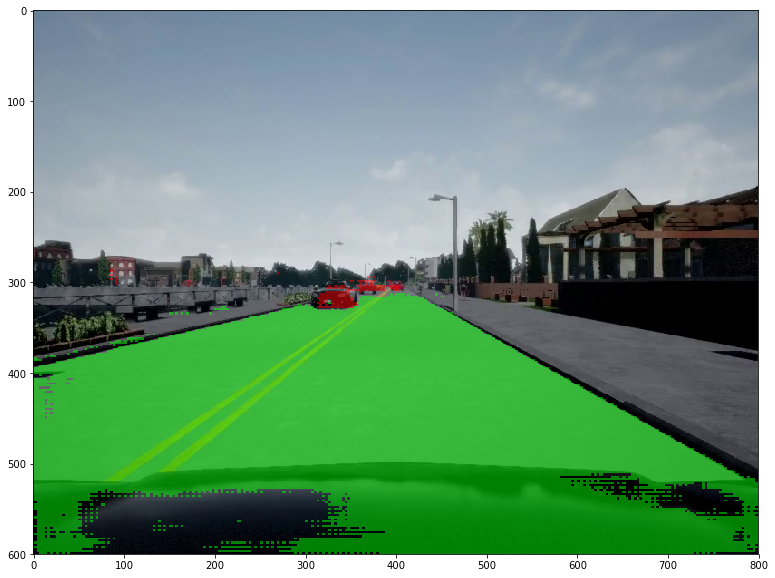

image shape: (600, 800)
car pixels: 2194
non-car pixels: 477806
road pixels: 153022
non-road pixels: 326978


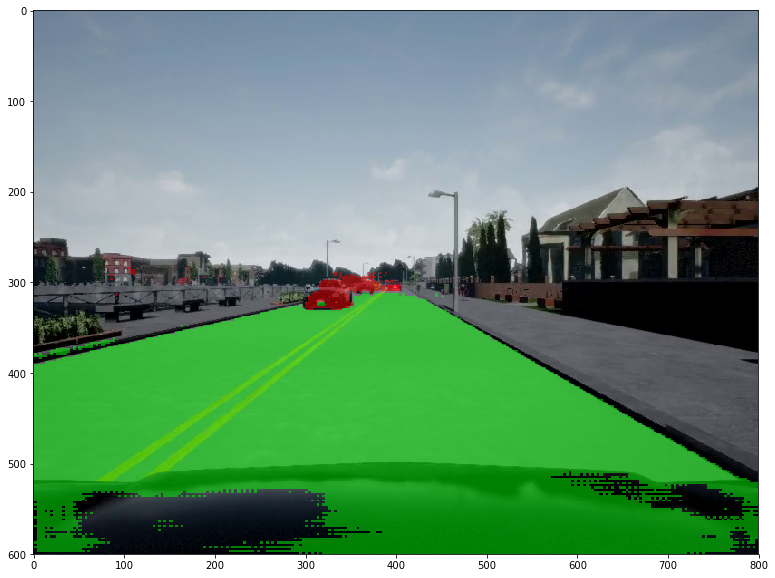

In [8]:
import json
import matplotlib.pyplot as plt
import base64
import numpy as np
import scipy.misc
import skvideo.io

VIDEO_PATH = "../Example/test_video.mp4"

# RESULTS_JSON_PATH = "../Example/results.json"
RESULTS_JSON_PATH = "./saved_results/2018-05-22-1919.json"

def decode(packet):
    img = base64.b64decode(packet)
    filename = './image.png'
    with open(filename, 'wb') as f:
        f.write(img)
    result = scipy.misc.imread(filename)
    return result

with open(RESULTS_JSON_PATH) as json_file:
    results = json.load(json_file)
    
video = skvideo.io.vread(VIDEO_PATH)
frame = 1

for rgb_frame in video:
    key = str(frame)
    result = results[key]
    seg_car = decode(result[0])
    seg_road = decode(result[1])
    print("image shape:", seg_car.shape)
    print("car pixels:", np.sum(seg_car == 1))
    print("non-car pixels:", np.sum(seg_car == 0))
    print("road pixels:", np.sum(seg_road == 1))
    print("non-road pixels:", np.sum(seg_road == 0))
    
#     plt.figure(figsize=(15,15))
#     plt.subplot(221), plt.imshow(seg_car, cmap='gray')
#     plt.subplot(222), plt.imshow(seg_road, cmap='gray')
#     plt.show()

    seg_car = seg_car.reshape(rgb_frame.shape[0], rgb_frame.shape[1], 1)
    seg_road = seg_road.reshape(rgb_frame.shape[0], rgb_frame.shape[1], 1)
    
    mask = np.dot(seg_road, np.array([[0, 255, 0, 127]])) + \
           np.dot(seg_car, np.array([[255, 0, 0, 127]]))

    mask = scipy.misc.toimage(mask, mode="RGBA")

    street_im = scipy.misc.toimage(rgb_frame)
    street_im.paste(mask, box=None, mask=mask)
    
    plt.figure(figsize=(15,10))
    plt.imshow(street_im)
    plt.show()
    
    frame += 1